# 뉴스 크롤링으로 관심도

In [124]:
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import font_manager, rc, rcParams
font_path = r'C:\Windows\Fonts\GULIM.ttc' # 한글 깨짐 방지
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

import warnings
warnings.filterwarnings("ignore")# 경고 무시 

## 뉴스

In [10]:
news_1 = pd.read_excel('./input/news/조선일보개수.xlsx')
news_2 = pd.read_excel('./input/news/중앙일보개수.xlsx')
#news_3 = pd.read_excel('./input/news/한국경제개수.xlsx')

In [156]:
news = pd.merge(news_1,news_2,how = 'inner', on="일자")
#news = pd.merge(news,news_3,how = 'inner', on ='일자')

In [157]:
#news['합계'] = news['개수_x']+news['개수_y']+news['개수']
news['합계'] = news['개수_x']+news['개수_y']

In [158]:
news['ym'] = news['일자'].apply(lambda x : str(x)[:6]) 

In [160]:
news_ym = news.groupby('ym').sum()
news_ym.drop(['일자','개수_x','개수_y'], axis =1, inplace = True)

## 신한카드

In [38]:
native_card = pd.read_csv('./input/NATIVE_RE.txt', sep = '|')

In [25]:
native_card_age = native_card.groupby(['ta_ym','cln_age_r']).sum().unstack()
native_card_age['ym'] = native_card_age.index
native_card_age['ym'] = native_card_age['ym'].apply(lambda x : str(x))
native_card_age.head()

vlm                                            \
cln_age_r            20            30            40            50   
ta_ym                                                               
201701     3.525705e+12  6.258801e+12  7.348104e+12  4.370430e+12   
201702     3.107915e+12  5.374928e+12  6.277919e+12  3.646990e+12   
201703     2.517564e+12  4.230248e+12  4.915898e+12  2.913226e+12   
201704     2.719377e+12  4.720418e+12  5.403026e+12  3.295225e+12   
201705     3.784107e+12  6.727335e+12  7.570074e+12  4.538711e+12   

                                                                       \
cln_age_r            60   .            20            30            40   
ta_ym                                                                   
201701     1.860203e+12 NaN           NaN           NaN           NaN   
201702     1.503006e+12 NaN  2.112917e+11  2.914553e+11  4.554120e+11   
201703     1.253228e+12 NaN  1.383897e+12  2.416657e+12  2.679583e+12   
201704     1.438058e+12 NaN  9.941167e+11  1.876451e+12  2.005312e+12   
201705     1.962561e+12 NaN  1.487945e+11  2.764529e+11  4.098917e+11   

                         ...         usec                              \
cln_age_r            50  ...           50          60   .          20   
ta_ym                    ...                                            
201701              NaN  ...   97665097.0  40974799.0 NaN         NaN   
201702     2.524443e+11  ...   82193397.0  34223660.0 NaN   9146343.0   
201703     1.601397e+12  ...   67787325.0  29214792.0 NaN  64985640.0   
201704     1.155702e+12  ...   78674534.0  33512923.0 NaN  49308421.0   
201705     2.142994e+11  ...  108572200.0  45986388.0 NaN   7430330.0   

                                                                     ym  
cln_age_r          30          40          50          60    기타          
ta_ym                                                                    
201701            NaN         NaN         NaN         NaN   NaN  201701  
201702      8310774.0  10239662.0   5970556.0   2453629.0   4.0  201702  
201703     65874267.0  64419549.0  38224551.0  15889682.0  33.0  201703  
201704     52218782.0  48057475.0  27007064.0  11448558.0  42.0  201704  
201705      7565764.0   9542254.0   4866996.0   2167943.0   8.0  201705  

[5 rows x 25 columns]

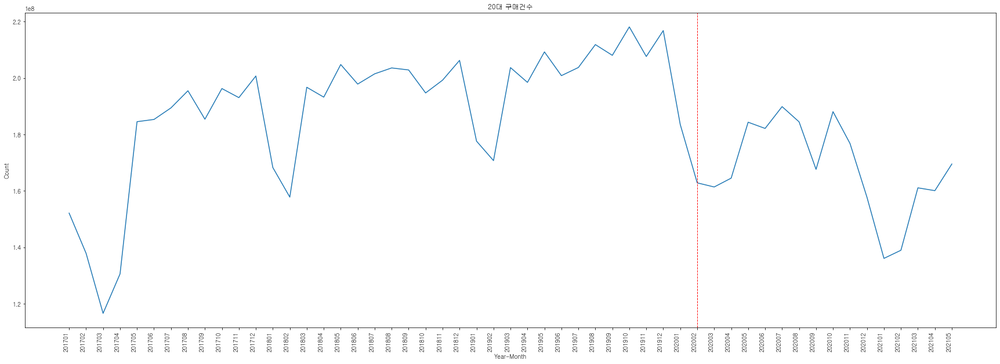

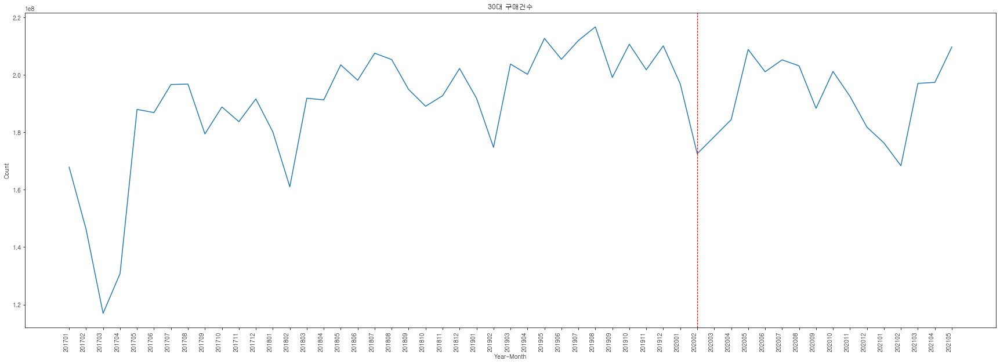

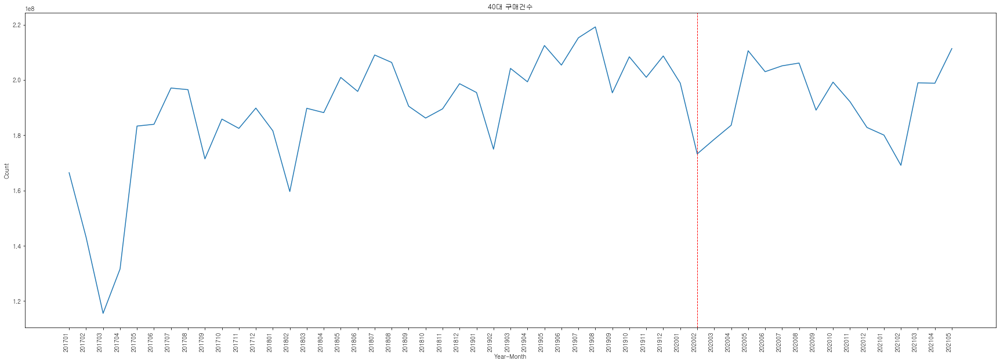

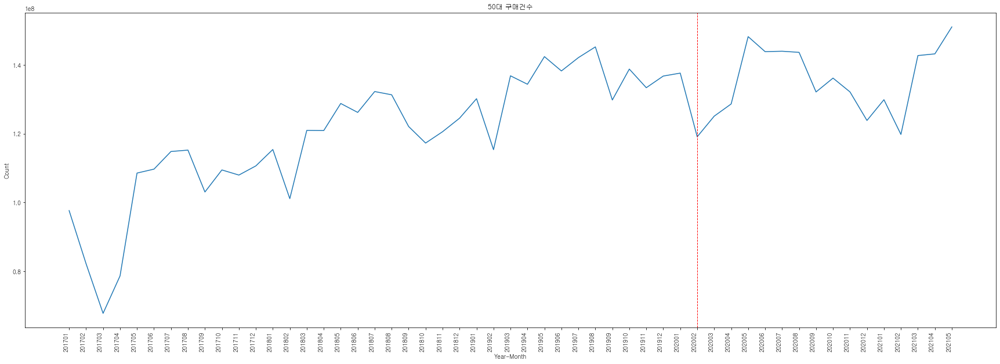

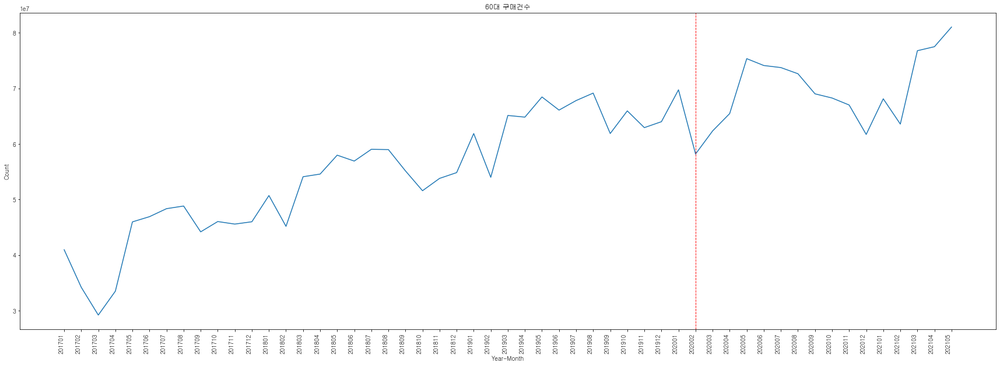

In [37]:
# 연령별 그래프
age_list = [20,30,40,50,60]
title_list = ['20대 구매건수', '30대 구매건수', '40대 구매건수', '50대 구매건수', '60대 구매건수']

for age, title in zip(age_list,title_list):
    plt.figure(figsize=[30,10])
    sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][age])
    plt.title(title)
    plt.xlabel('Year-Month')
    plt.xticks(rotation=90,ha = 'right')
    plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)
    plt.ylabel('Count')

In [77]:
native_card_age_news=pd.merge(native_card_age,news_ym, how = 'left', on='ym')

In [79]:
native_card_age_news.columns

Index([          'ym',    ('vlm', 20),    ('vlm', 30),    ('vlm', 40),
          ('vlm', 50),    ('vlm', 60),   ('vlm', '.'),  ('vlm', '20'),
        ('vlm', '30'),  ('vlm', '40'),  ('vlm', '50'),  ('vlm', '60'),
        ('vlm', '기타'),   ('usec', 20),   ('usec', 30),   ('usec', 40),
         ('usec', 50),   ('usec', 60),  ('usec', '.'), ('usec', '20'),
       ('usec', '30'), ('usec', '40'), ('usec', '50'), ('usec', '60'),
       ('usec', '기타'),     ('ym', ''),           '합계'],
      dtype='object')

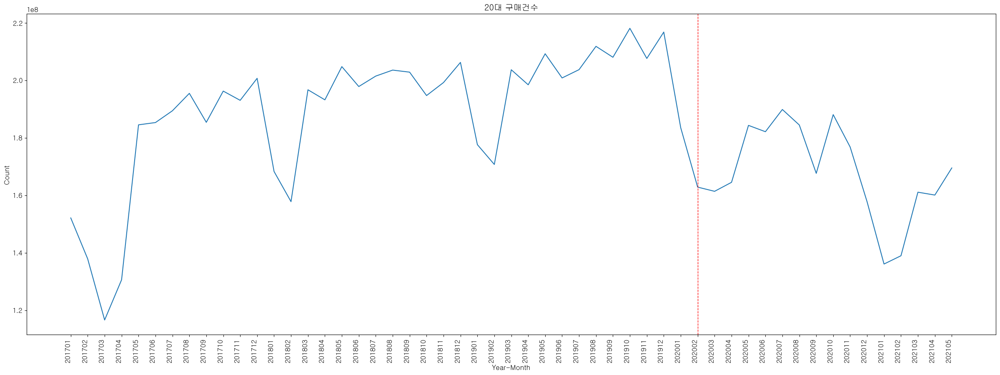

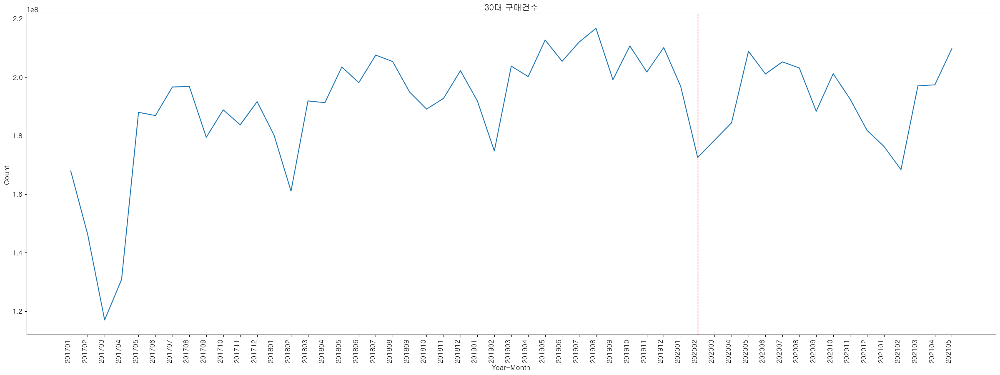

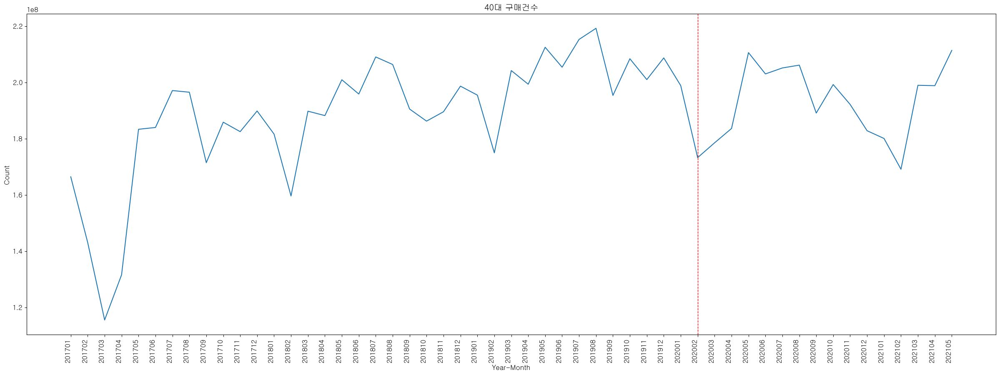

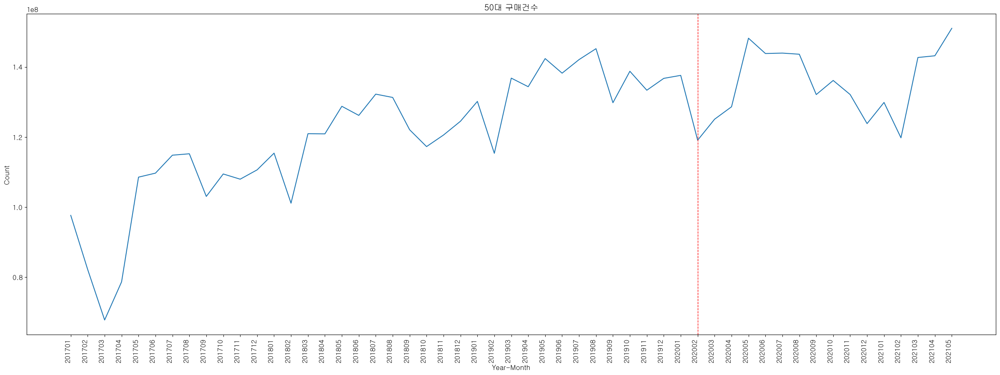

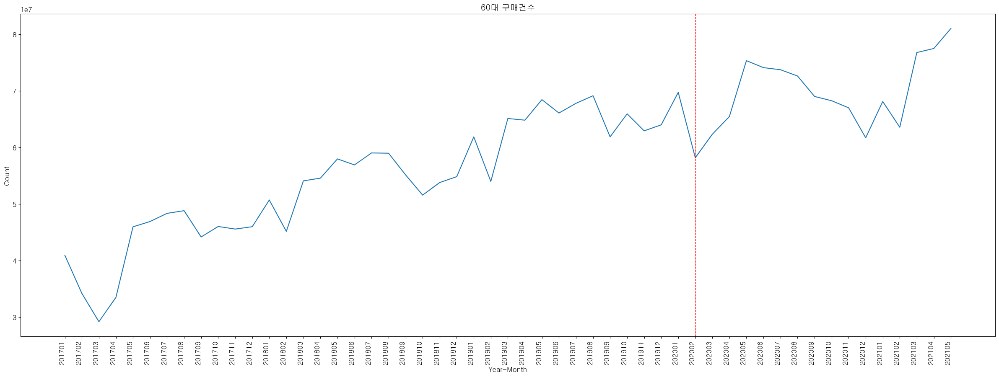

In [125]:
# 연령별 그래프
age_list = [20,30,40,50,60]
title_list = ['20대 구매건수', '30대 구매건수', '40대 구매건수', '50대 구매건수', '60대 구매건수']

for age, title in zip(age_list,title_list):
    plt.figure(figsize=[30,10])
    sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][age])
    plt.title(title)
    plt.xlabel('Year-Month')
    plt.xticks(rotation=90,ha = 'right')
    plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)
    plt.ylabel('Count')

Text(0, 0.5, 'Count')

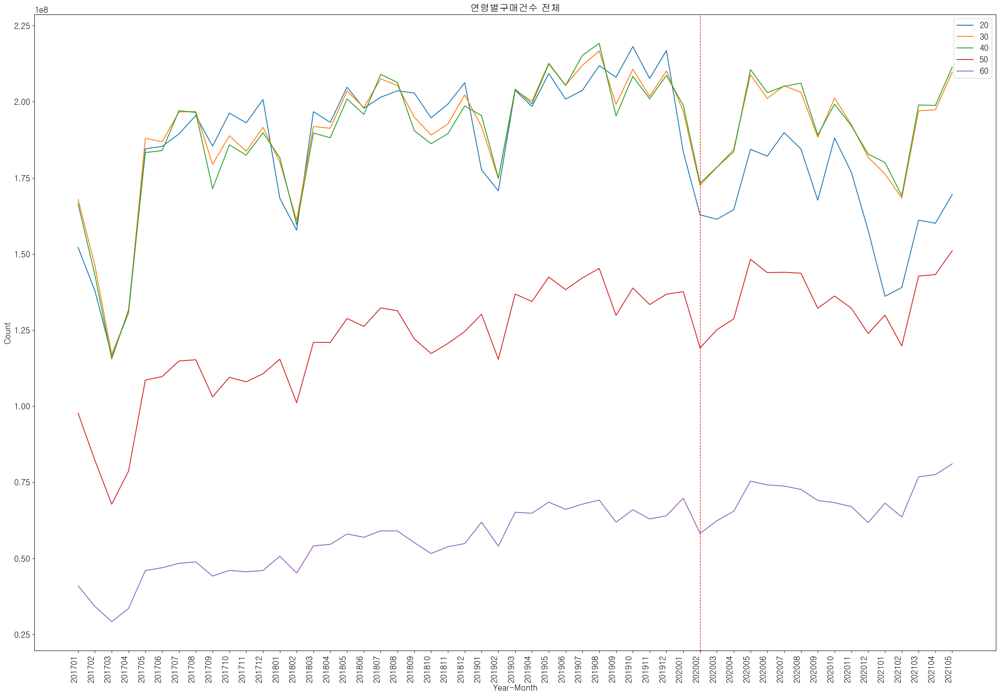

In [406]:
plt.figure(figsize=[30,20])
sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][20], label = 20)
sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][30], label = 30)
sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][40], label = 40)
sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][50], label = 50)
sns.lineplot(x=native_card_age['ym'], y=native_card_age['usec'][60], label = 60)
#sns.lineplot(x=news_ym.index, y=news_ym['합계'])
plt.title('연령별구매건수 전체')
plt.xlabel('Year-Month')
plt.xticks(rotation=90,ha ='right')
plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)
plt.ylabel('Count')

In [198]:
# 코로나 전 대비 이용건수 증감률
change_rate = []
for idx in native_card_age.index[36:48]:
    change_rate.append((native_card_age.loc[idx]['usec'][:5] - native_card_age.loc[idx-100]['usec'][:5]) /native_card_age.loc[idx-100]['usec'][:5])
for idx in native_card_age.index[48:]:
    change_rate.append((native_card_age.loc[idx]['usec'][:5] - native_card_age.loc[idx-200]['usec'][:5]) /native_card_age.loc[idx-200]['usec'][:5])

native_card_after = pd.DataFrame(change_rate)
native_card_after.set_index([native_card_age.index[36:]],inplace = True)

native_card_after

cln_age_r,20,30,40,50,60
ta_ym,,,,,
202001,0.033280,0.026089,0.017417,0.057108,0.127134
202002,-0.046178,-0.012668,-0.009727,0.032483,0.077603
202003,-0.207694,-0.124198,-0.125737,-0.085755,-0.042765
202004,-0.170995,-0.078918,-0.078910,-0.042631,0.009863
202005,-0.119089,-0.018011,-0.008907,0.040847,0.100684
202006,-0.093162,-0.021179,-0.011625,0.040580,0.121393
202007,-0.068056,-0.031788,-0.047105,0.013065,0.087553
202008,-0.129220,-0.062574,-0.059674,-0.010900,0.050415
202009,-0.194195,-0.054141,-0.032086,0.017927,0.115396


In [215]:
# 월별 20~60대 거래건수 , 뉴스개수
interest_pay=pd.merge(native_card_after,news_ym[:-2].set_index([native_card_after.index]), how = 'left', left_index= True, right_index = True)
interest_pay.index =[str(x) for x in interest_pay.index]

In [256]:
interest_pay[1:]

,20,30,40,50,60,합계
202002,-0.046178,-0.012668,-0.009727,0.032483,0.077603,6274
202003,-0.207694,-0.124198,-0.125737,-0.085755,-0.042765,12333
202004,-0.170995,-0.078918,-0.078910,-0.042631,0.009863,11099
202005,-0.119089,-0.018011,-0.008907,0.040847,0.100684,9220
202006,-0.093162,-0.021179,-0.011625,0.040580,0.121393,7759
202007,-0.068056,-0.031788,-0.047105,0.013065,0.087553,6862
202008,-0.129220,-0.062574,-0.059674,-0.010900,0.050415,8001
202009,-0.194195,-0.054141,-0.032086,0.017927,0.115396,6639
202010,-0.137698,-0.045044,-0.043981,-0.018912,0.035105,4455
202011,-0.148422,-0.045935,-0.043923,-0.009180,0.064680,4863


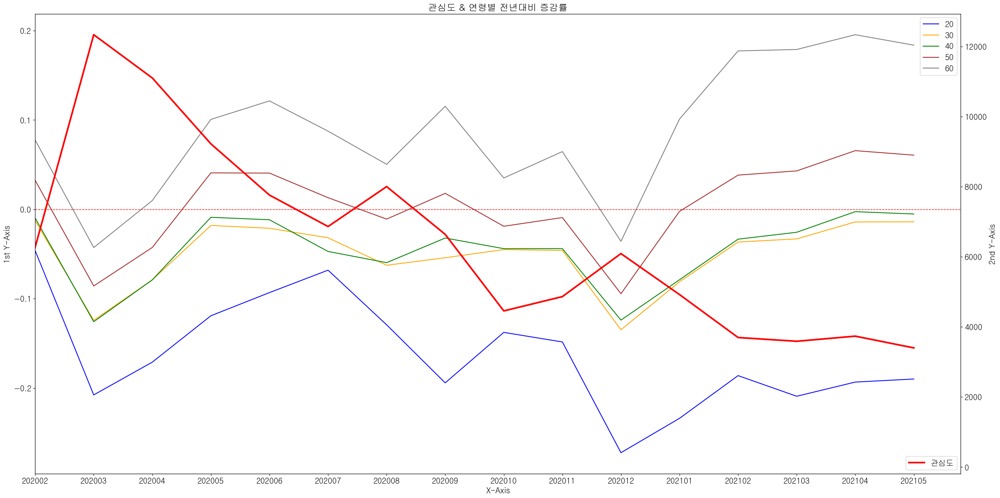

In [407]:
# 2019년 대비 월별 연령별 증감량 & 관심도
plt.rcParams['figure.figsize'] = (30, 15)
plt.rcParams['font.size'] = 14

fig, ax1 = plt.subplots()
ax1.set_xlabel('X-Axis')
ax1.set_ylabel('1st Y-Axis')
ax1.plot(interest_pay.index, interest_pay[20], color='blue', label='20')
ax1.plot(interest_pay.index, interest_pay[30], color='orange', label='30')
ax1.plot(interest_pay.index, interest_pay[40], color='green', label='40')
ax1.plot(interest_pay.index, interest_pay[50], color='brown', label='50')
ax1.plot(interest_pay.index, interest_pay[60], color='gray', label='60')
ax1.legend(loc='upper right')
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)

ax2 = ax1.twinx()
ax2.set_ylabel('2nd Y-Axis')
ax2.plot(interest_pay.index, interest_pay['합계'], color='red', label='관심도', linewidth=3)
ax2.legend(loc='lower right')

plt.title('관심도 & 연령별 전년대비 증감률')
plt.xlim(1)

plt.show()

In [248]:
usec = []
for idx in native_card_age.index[36:]:
    usec.append(native_card_age.loc[idx]['usec'][:5])

native_card_after_usec = pd.DataFrame(usec)
native_card_after_usec.set_index([native_card_age.index[36:]],inplace = True)

interest_usec=pd.merge(native_card_after_usec,news_ym[:-2].set_index([native_card_after_usec.index]), how = 'left', left_index= True, right_index = True)
interest_usec.index =[str(x) for x in interest_pay.index]

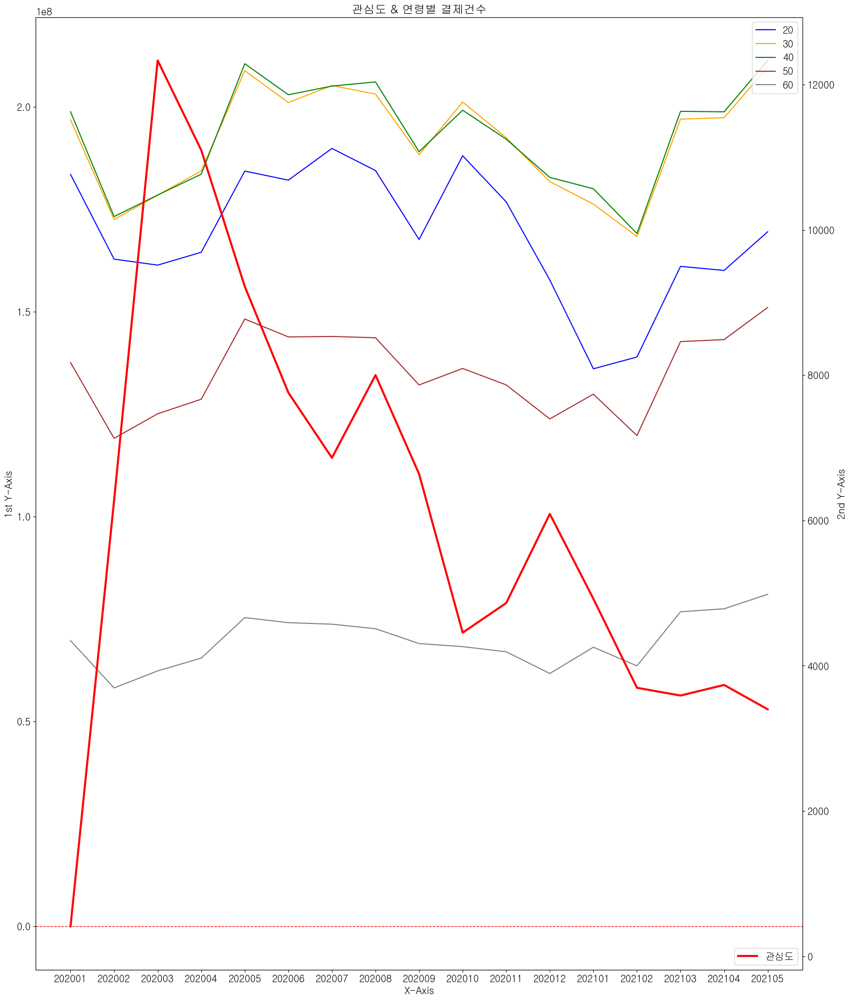

In [408]:
# 관심도 & 연령별 결제건수
plt.rcParams['figure.figsize'] = (20, 25)
plt.rcParams['font.size'] = 14

fig, ax1 = plt.subplots()
ax1.set_xlabel('X-Axis')
ax1.set_ylabel('1st Y-Axis')
ax1.plot(interest_usec.index, interest_usec[20], color='blue', label='20')
ax1.plot(interest_usec.index, interest_usec[30], color='orange', label='30')
ax1.plot(interest_usec.index, interest_usec[40], color='green', label='40')
ax1.plot(interest_usec.index, interest_usec[50], color='brown', label='50')
ax1.plot(interest_usec.index, interest_usec[60], color='gray', label='60')
ax1.legend(loc='upper right')
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)

ax2 = ax1.twinx()
ax2.set_ylabel('2nd Y-Axis')
ax2.plot(interest_usec.index, interest_usec['합계'], color='red', label='관심도', linewidth=3)
ax2.legend(loc='lower right')
plt.title('관심도 & 연령별 결제건수')


plt.show()

# 휴일 & 평일저녁만 뽑아서 다시

In [319]:
native_card.head()

,v1,v2,v3,gb3,gb2,sex_ccd,cln_age_r,ta_ym,daw_ccd_r,apv_ts_dl_tm_r,vlm,usec,close
0,세종,세종,.,취미오락,외식,M,30,201701,RED,활동,351296766,19010,1
1,세종,세종,.,취미오락,종합쇼핑,M,50,201701,RED,휴식,72244196,2375,1
2,세종,세종,.,취미오락,종합쇼핑,M,30,201701,WHITE,휴식,532911085,19979,1
3,충남,세종,.,취미오락,종합쇼핑,M,50,201701,WHITE,활동,50972534,951,0
4,충남,세종,.,취미오락,종합쇼핑,M,40,201701,RED,휴식,19104457,408,0


In [327]:
native_rest = native_card[((native_card['daw_ccd_r']=='RED') & (native_card['apv_ts_dl_tm_r'] == '휴식')) | (native_card['daw_ccd_r']=='WHITE')]
native_rest

,v1,v2,v3,gb3,gb2,sex_ccd,cln_age_r,ta_ym,daw_ccd_r,apv_ts_dl_tm_r,vlm,usec,close
1,세종,세종,.,취미오락,종합쇼핑,M,50,201701,RED,휴식,72244196,2375,1
2,세종,세종,.,취미오락,종합쇼핑,M,30,201701,WHITE,휴식,532911085,19979,1
3,충남,세종,.,취미오락,종합쇼핑,M,50,201701,WHITE,활동,50972534,951,0
4,충남,세종,.,취미오락,종합쇼핑,M,40,201701,RED,휴식,19104457,408,0
5,경기,세종,.,취미오락,종합쇼핑,M,40,201701,WHITE,활동,116238820,3048,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52714745,울산,부산,해운대구,문화예술활동,사진촬영,M,30,202008,WHITE,휴식,1946910,10,0
52714746,강원,부산,해운대구,취미오락,미용,F,50,202007,WHITE,활동,45810,5,0
52714748,충북,부산,해운대구,여행,숙박,F,60,202102,WHITE,휴식,254000,5,0
52714749,울산,부산,해운대구,취미오락,유흥,F,50,202104,WHITE,활동,65910,15,0


In [329]:
native_rest_age = native_rest.groupby(['ta_ym','cln_age_r']).sum().unstack()
native_rest_age['ym'] = native_rest_age.index
native_rest_age['ym'] = native_rest_age['ym'].apply(lambda x : str(x))
native_rest_age.head()

vlm                                            \
cln_age_r            20            30            40            50   
ta_ym                                                               
201701     2.879018e+12  5.078771e+12  5.966164e+12  3.506593e+12   
201702     2.514578e+12  4.297144e+12  5.000882e+12  2.870467e+12   
201703     2.074303e+12  3.423306e+12  3.931802e+12  2.315570e+12   
201704     2.073214e+12  3.580834e+12  4.031156e+12  2.433213e+12   
201705     3.134230e+12  5.538866e+12  6.189717e+12  3.650937e+12   

                                                                       \
cln_age_r            60   .            20            30            40   
ta_ym                                                                   
201701     1.480387e+12 NaN           NaN           NaN           NaN   
201702     1.156443e+12 NaN  1.714615e+11  2.252656e+11  3.575781e+11   
201703     9.994985e+11 NaN  1.112471e+12  1.970723e+12  2.154160e+12   
201704     1.046046e+12 NaN  7.808072e+11  1.449382e+12  1.506616e+12   
201705     1.573128e+12 NaN  1.217271e+11  2.220511e+11  3.241738e+11   

                         ...    close                                        \
cln_age_r            50  ...       50       60   .      20      30       40   
ta_ym                    ...                                                  
201701              NaN  ...  24571.0  20207.0 NaN     NaN     NaN      NaN   
201702     1.965546e+11  ...  22528.0  18431.0 NaN  1758.0  1890.0   1952.0   
201703     1.267685e+12  ...  15828.0  12851.0 NaN  9209.0  9693.0  10387.0   
201704     8.386849e+11  ...  17761.0  14360.0 NaN  7284.0  7997.0   8186.0   
201705     1.760391e+11  ...  24431.0  20257.0 NaN  1424.0  1551.0   1544.0   

                                    ym  
cln_age_r      50      60   기타          
ta_ym                                   
201701        NaN     NaN  NaN  201701  
201702     1856.0  1514.0  0.0  201702  
201703     9540.0  8080.0  5.0  201703  
201704     7742.0  6614.0  4.0  201704  
201705     1586.0  1289.0  1.0  201705  

[5 rows x 37 columns]

Text(0, 0.5, 'Count')

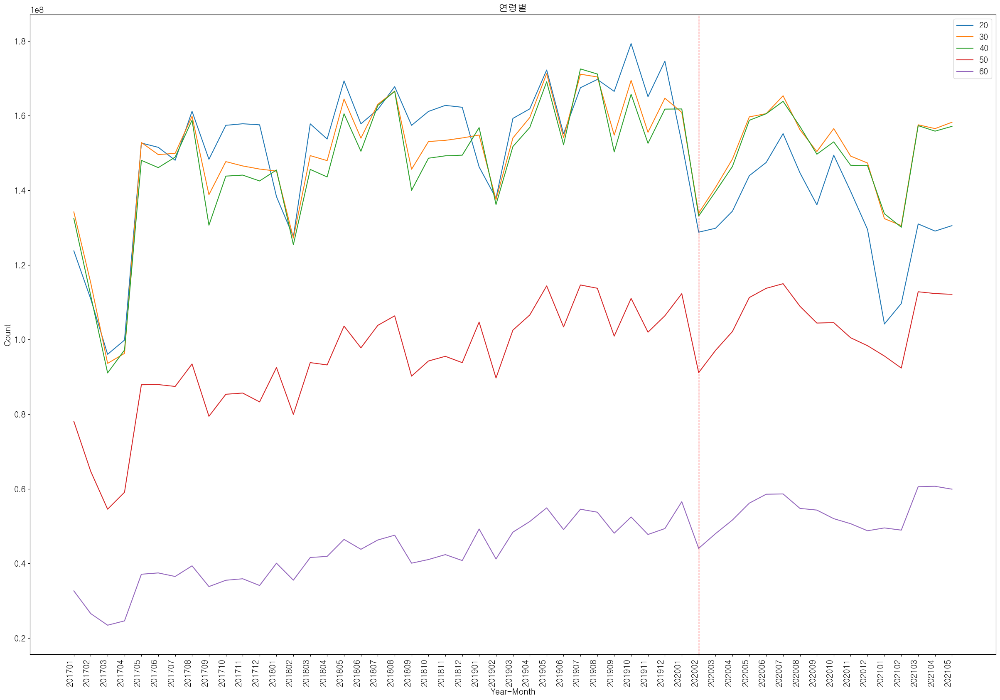

In [330]:
plt.figure(figsize=[30,20])
sns.lineplot(x=native_rest_age['ym'], y=native_rest_age['usec'][20], label = 20)
sns.lineplot(x=native_rest_age['ym'], y=native_rest_age['usec'][30], label = 30)
sns.lineplot(x=native_rest_age['ym'], y=native_rest_age['usec'][40], label = 40)
sns.lineplot(x=native_rest_age['ym'], y=native_rest_age['usec'][50], label = 50)
sns.lineplot(x=native_rest_age['ym'], y=native_rest_age['usec'][60], label = 60)
#sns.lineplot(x=news_ym.index, y=news_ym['합계'])
plt.title('연령별')
plt.xlabel('Year-Month')
plt.xticks(rotation=90,ha ='right')
plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)
plt.ylabel('Count')

In [331]:
# 코로나 전 대비 이용건수 증감률
change_rate = []
for idx in native_rest_age.index[36:48]:
    change_rate.append((native_rest_age.loc[idx]['usec'][:5] - native_rest_age.loc[idx-100]['usec'][:5]) /native_rest_age.loc[idx-100]['usec'][:5])
for idx in native_card_age.index[48:]:
    change_rate.append((native_rest_age.loc[idx]['usec'][:5] - native_rest_age.loc[idx-200]['usec'][:5]) /native_rest_age.loc[idx-200]['usec'][:5])

native_rest_after = pd.DataFrame(change_rate)
native_rest_after.set_index([native_rest_age.index[36:]],inplace = True)

native_rest_after

cln_age_r,20,30,40,50,60
ta_ym,,,,,
202001,0.044216,0.039231,0.031865,0.072758,0.148593
202002,-0.065998,-0.026382,-0.022540,0.016025,0.068956
202003,-0.184804,-0.085975,-0.079544,-0.052910,-0.008108
202004,-0.169392,-0.069794,-0.066632,-0.041666,0.007791
202005,-0.164423,-0.067621,-0.061097,-0.027306,0.023035
202006,-0.049482,0.041705,0.054603,0.100048,0.192911
202007,-0.073442,-0.033787,-0.050295,0.003037,0.075040
202008,-0.147539,-0.083051,-0.082259,-0.042444,0.018881
202009,-0.182573,-0.028370,-0.004130,0.034703,0.128843


In [ ]:
# 월별 20~60대 거래건수 , 뉴스개수
interest_pay=pd.merge(native_card_after,news_ym[:-2].set_index([native_card_after.index]), how = 'left', left_index= True, right_index = True)
interest_pay.index =[str(x) for x in interest_pay.index]

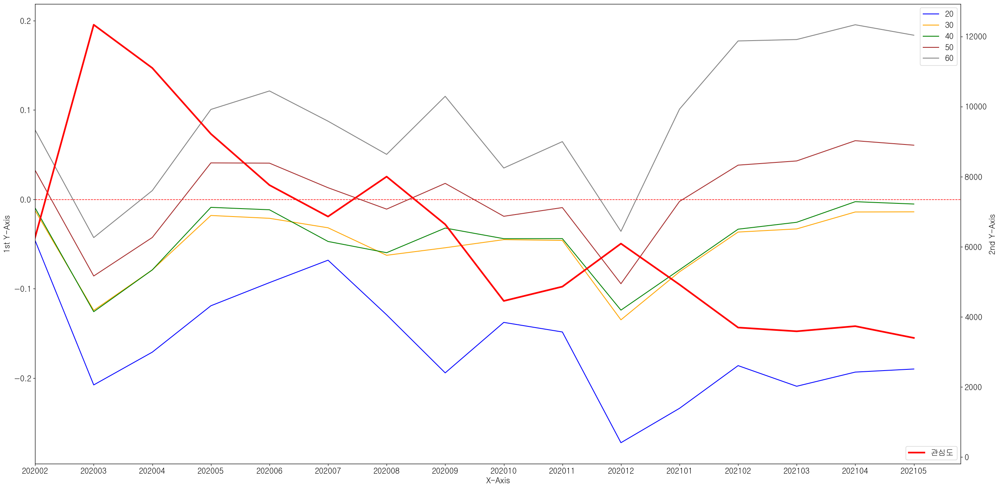

In [411]:
# 2019년 대비 월별 연령별 증감량 & 관심도
plt.rcParams['figure.figsize'] = (30, 15)
plt.rcParams['font.size'] = 14

fig, ax1 = plt.subplots()
ax1.set_xlabel('X-Axis')
ax1.set_ylabel('1st Y-Axis')
ax1.plot(interest_pay.index, interest_pay[20], color='blue', label='20')
ax1.plot(interest_pay.index, interest_pay[30], color='orange', label='30')
ax1.plot(interest_pay.index, interest_pay[40], color='green', label='40')
ax1.plot(interest_pay.index, interest_pay[50], color='brown', label='50')
ax1.plot(interest_pay.index, interest_pay[60], color='gray', label='60')
ax1.legend(loc='upper right')
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)

ax2 = ax1.twinx()
ax2.set_ylabel('2nd Y-Axis')
ax2.plot(interest_pay.index, interest_pay['합계'], color='red', label='관심도', linewidth=3)
ax2.legend(loc='lower right')

plt.xlim(1)

plt.show()

# 연령별 업종 추이
### 20,30,40,50,60대 업종별로 그래프 

In [333]:
native_rest_20 = native_rest[native_rest['cln_age_r']==20] # 20 대만 추출

In [352]:
native_rest_20 = native_rest_20.groupby(['gb2','ta_ym']).sum()['usec'].unstack().T # 그룹핑

In [377]:
native_rest_20.index = native_rest_20.index.astype('str') # 인덱스 str로

<AxesSubplot:xlabel='ta_ym'>

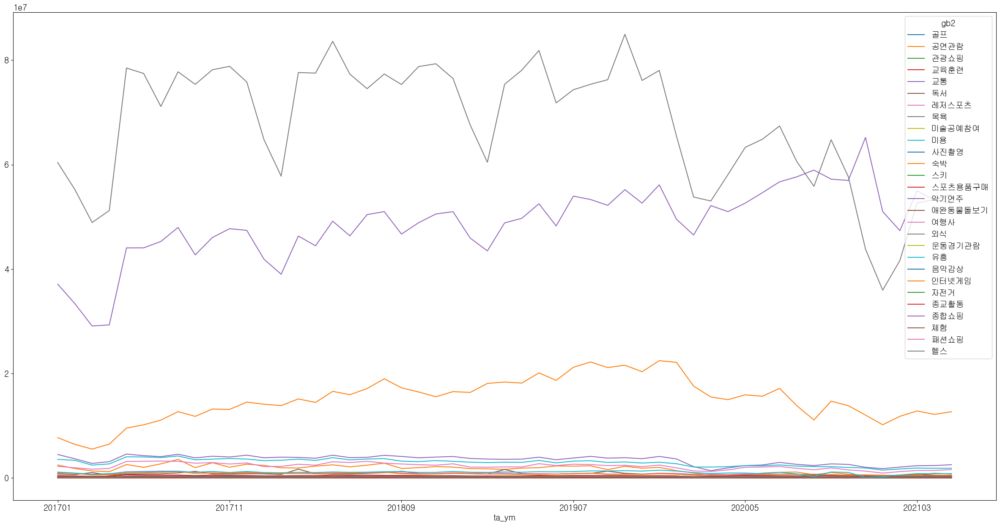

In [378]:
plt.rcParams['figure.figsize'] = (30, 10)
native_rest_20.plot()

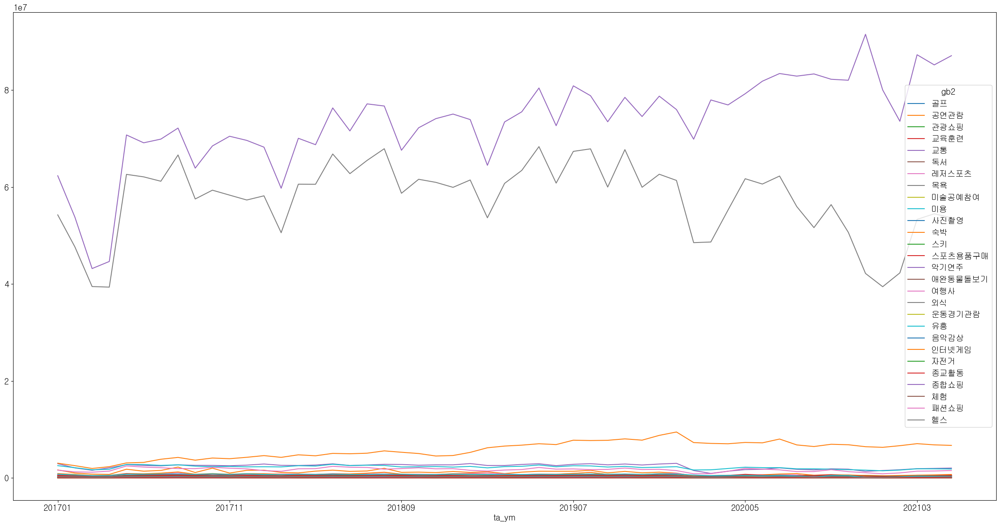

In [441]:
# 30대
native_rest_30 = native_rest[native_rest['cln_age_r']==30]
native_rest_30 = native_rest_30.groupby(['gb2','ta_ym']).sum()['usec'].unstack().T
native_rest_30.index = native_rest_20.index.astype('str')

plt.rcParams['figure.figsize'] = (30, 15)
native_rest_30.plot()
plt.show()

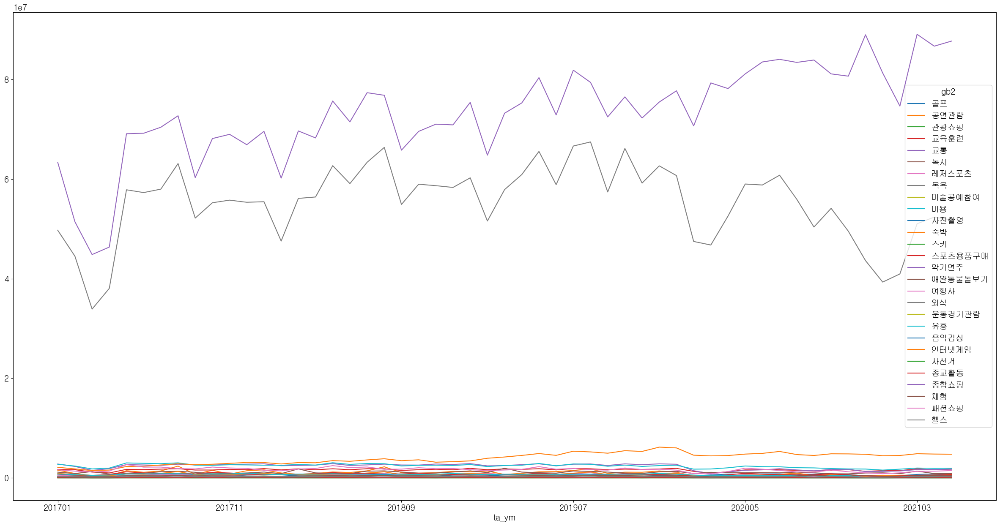

In [442]:
# 40대 
native_rest_40 = native_rest[native_rest['cln_age_r']==40]
native_rest_40 = native_rest_40.groupby(['gb2','ta_ym']).sum()['usec'].unstack().T
native_rest_40.index = native_rest_40.index.astype('str')

plt.rcParams['figure.figsize'] = (30, 15)
native_rest_40.plot()
plt.show()

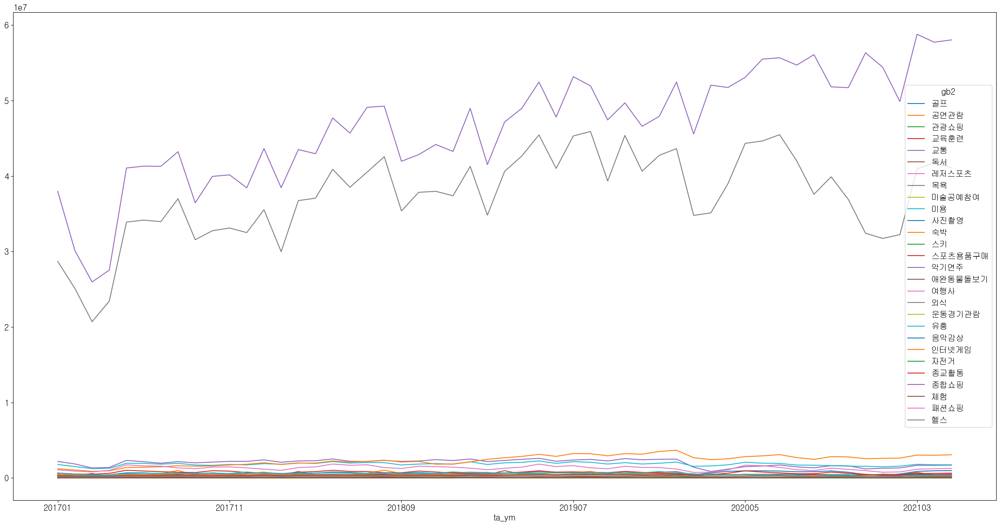

In [443]:
# 50대 
native_rest_50 = native_rest[native_rest['cln_age_r']==50]
native_rest_50 = native_rest_50.groupby(['gb2','ta_ym']).sum()['usec'].unstack().T
native_rest_50.index = native_rest_50.index.astype('str')

plt.rcParams['figure.figsize'] = (30, 15)
native_rest_50.plot()
plt.show()

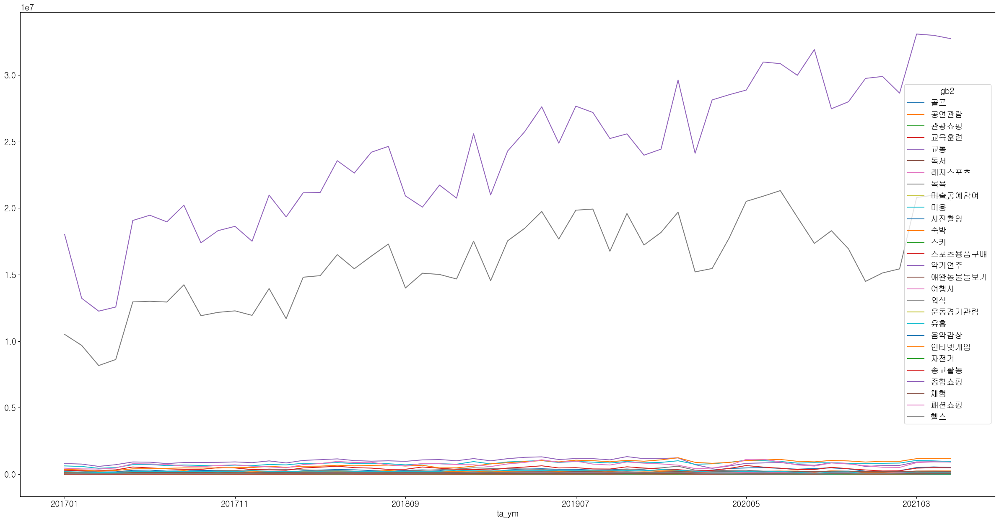

In [444]:
# 60대 
native_rest_60 = native_rest[native_rest['cln_age_r']==60]
native_rest_60 = native_rest_60.groupby(['gb2','ta_ym']).sum()['usec'].unstack().T
native_rest_60.index = native_rest_60.index.astype('str')

plt.rcParams['figure.figsize'] = (30, 15)
native_rest_60.plot()
plt.show()


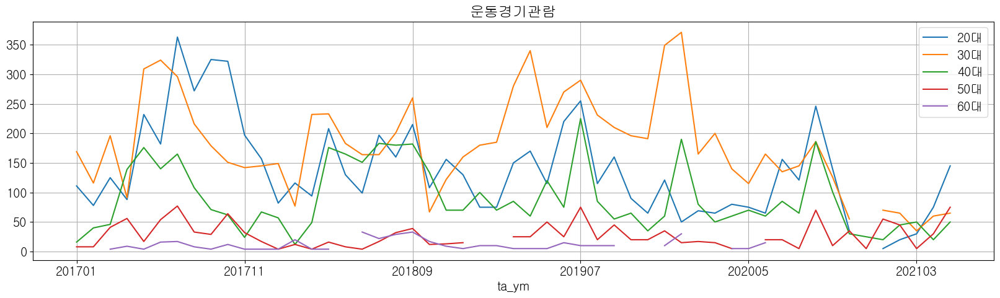

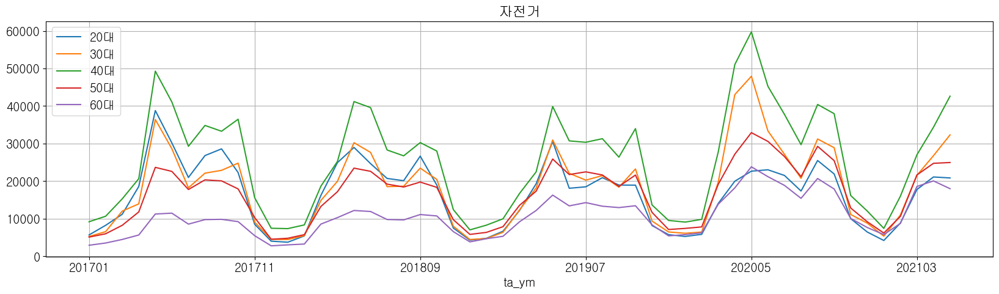

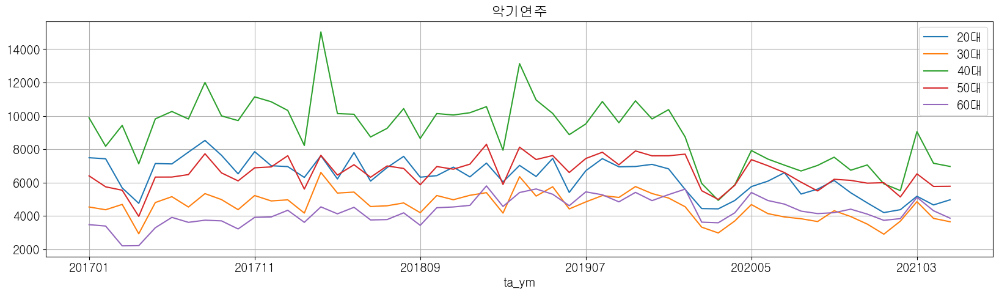

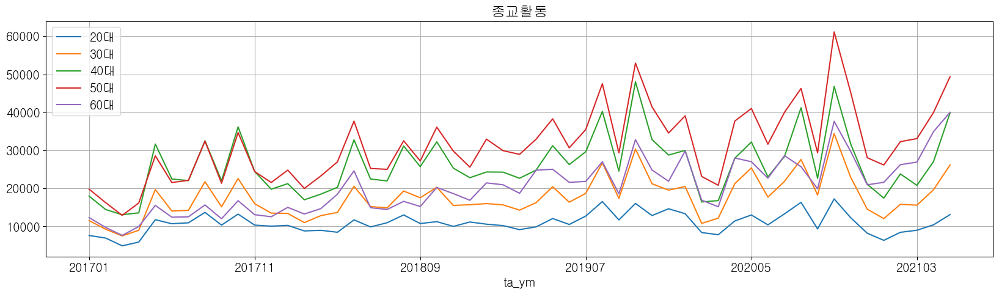

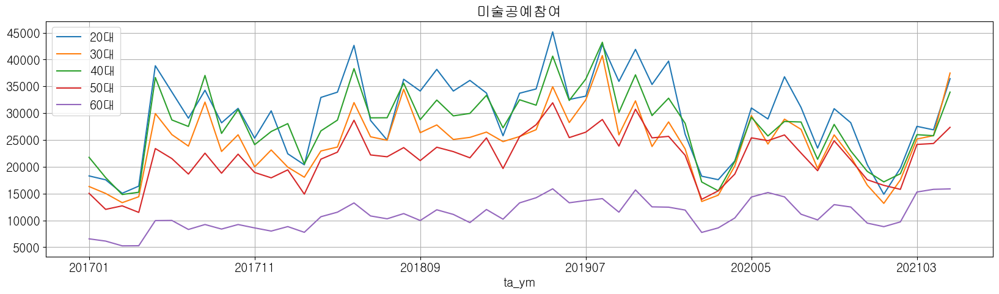

...

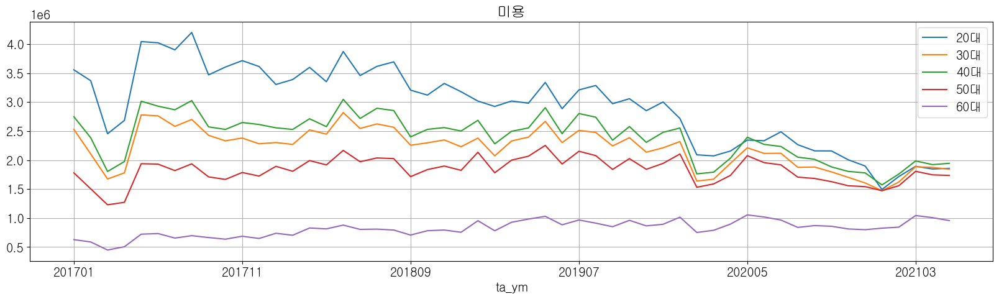

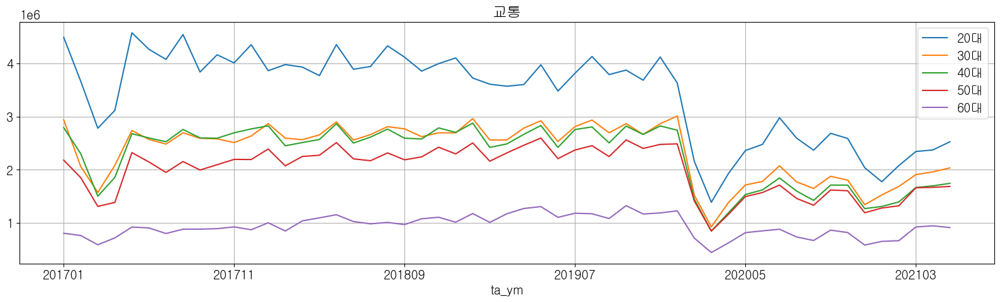

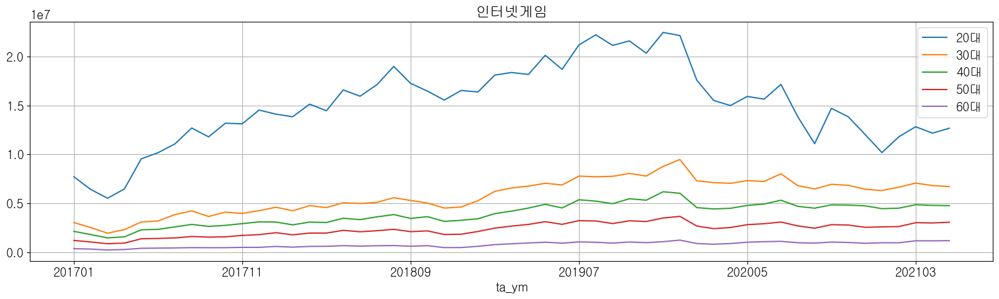

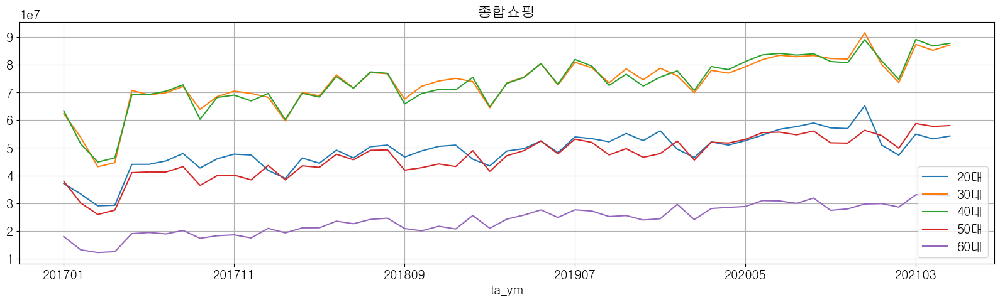

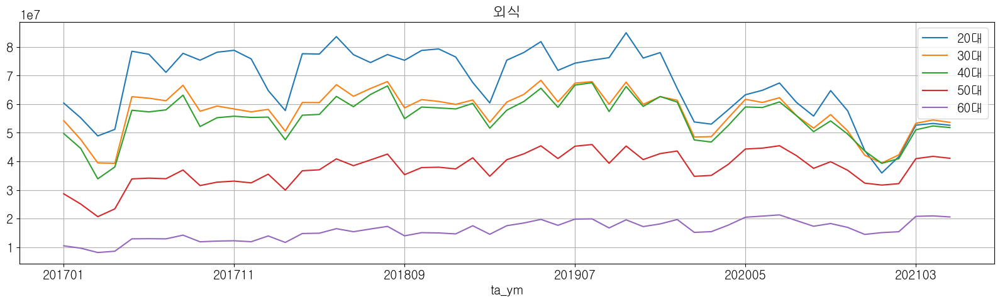

In [445]:
# 업종별 그래프
plt.rcParams['figure.figsize'] = (20, 5)
for idx in native_rest_20.iloc[0].sort_values().index:
    native_rest_20[idx].plot(grid =True)
    native_rest_30[idx].plot(grid =True)
    native_rest_40[idx].plot(grid =True)
    native_rest_50[idx].plot(grid =True)
    native_rest_60[idx].plot(grid =True)
    plt.legend(['20대','30대','40대','50대','60대'])
    plt.title(idx)
    plt.show()

# 개인화 
## 연령별 결제금액 -> 사용불가 // 여가조사로 가야할듯

In [447]:
native_rest_agenative_rest.groupby(['ta_ym','cln_age_r']).sum()

vlm       usec  close
ta_ym  cln_age_r                                 
201701 20         2879017967055  123765000  23586
       30         5078771464994  134197117  24672
       40         5966164150894  132455032  26210
       50         3506593300562   78077500  24571
       60         1480387401330   32655068  20207
...                         ...        ...    ...
202105 20         3273024702927  130527656  23568
       30         5894818267549  158235073  24456
       40         6631869102111  157133916  26276
       50         4436301750914  112122188  25729
       60         2273891160651   59906995  22012

[301 rows x 3 columns]

<AxesSubplot:xlabel='ta_ym'>

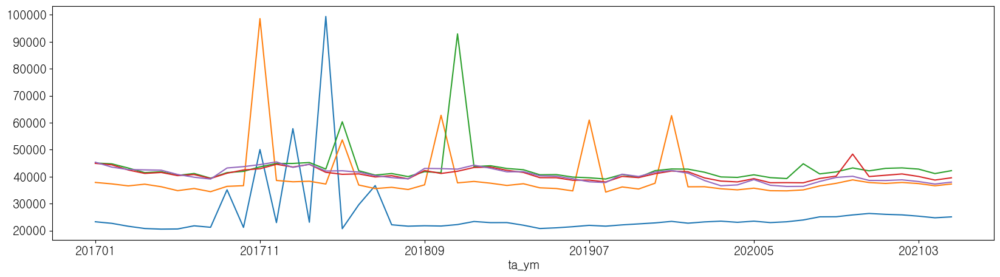

In [461]:
native_rest_age.index = native_rest_age.index.astype('str')
(native_rest_age['vlm'][20] / native_rest_age['usec'][20]).plot()
(native_rest_age['vlm'][30] / native_rest_age['usec'][30]).plot()
(native_rest_age['vlm'][40] / native_rest_age['usec'][40]).plot()
(native_rest_age['vlm'][50] / native_rest_age['usec'][50]).plot()
(native_rest_age['vlm'][60] / native_rest_age['usec'][60]).plot()


## 근거리

In [262]:
native_card['close'] = native_card.apply(lambda x : 1 if x.v1 == x.v2 else 0, axis = 1)

In [263]:
native_card['close']

0           1
1           1
2           1
3           0
4           0
           ..
52714749    0
52714750    0
52714751    0
52714752    0
52714753    0
Name: close, Length: 52714754, dtype: int64

In [271]:
안양 = native_card[native_card['v3'] == '안양시']
안양 = 안양[안양['cln_age_r'] == 20]
안양

,v1,v2,v3,gb3,gb2,sex_ccd,cln_age_r,ta_ym,daw_ccd_r,apv_ts_dl_tm_r,vlm,usec,close
2417,전남,경기,안양시,여행,숙박,M,20,201701,WHITE,활동,2351552,18,0
2418,서울,경기,안양시,취미오락,외식,M,20,201701,RED,휴식,182452943,7261,0
2420,서울,경기,안양시,취미오락,종합쇼핑,M,20,201701,WHITE,활동,105169172,5373,0
2423,경기,경기,안양시,문화예술활동,사진촬영,F,20,201701,WHITE,활동,22855480,1132,1
2424,경기,경기,안양시,취미오락,독서,F,20,201701,WHITE,활동,42722707,1944,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52711475,충북,경기,안양시,취미오락,애완동물돌보기,F,20,202012,RED,휴식,384272,10,0
52713974,강원,경기,안양시,취미오락,유흥,M,20,202105,WHITE,휴식,381750,10,0
52713975,제주,경기,안양시,취미오락,인터넷게임,M,20,202009,RED,휴식,71540,10,0
52713977,경북,경기,안양시,문화예술활동,공연관람,F,20,202104,RED,휴식,12675,5,0


In [268]:
native_card['v3'].unique()

array(['.', '남구', '동구', '북구', '서구', '중구', '가평군', '강남구', '강동구', '강릉시',
       '강북구', '강서구', '강진군', '강화군', '거제시', '거창군', '경산시', '경주시', '계룡시',
       '계양구', '고령군', '고성군', '고양시', '고창군', '고흥군', '곡성군', '공주시', '과천시',
       '관악구', '광명시', '광산구', '광양시', '광주시', '광진구', '괴산군', '구례군', '구로구',
       '구리시', '구미시', '군산시', '군위군', '군포시', '금산군', '금정구', '금천구', '기장군',
       '김제시', '김천시', '김포시', '김해시', '나주시', '남동구', '남원시', '남해군', '노원구',
       '논산시', '단양군', '달서구', '달성군', '담양군', '당진시', '대덕구', '도봉구', '동래구',
       '동작구', '동해시', '마포구', '목포시', '무안군', '무주군', '문경시', '밀양시', '보령시',
       '보성군', '보은군', '봉화군', '부안군', '부여군', '부천시', '부평구', '사상구', '사천시',
       '사하구', '산청군', '삼척시', '상주시', '서산시', '서천군', '서초구', '성남시', '성동구',
       '성북구', '성주군', '속초시', '송파구', '수성구', '수영구', '수원시', '순창군', '순천시',
       '시흥시', '아산시', '안동시', '안산시', '안성시', '안양시', '양구군', '양산시', '양양군',
       '양주시', '양천구', '양평군', '여수시', '여주시', '연수구', '연제구', '연천군', '영광군',
       '영덕군', '영도구', '영동군', '영암군', '영월군', '영주시', '영천시', '예산군', '오산시',
       '옥천군', '옹진군',

In [279]:
안양_ = 안양.groupby(['ta_ym']).mean()
안양_['ym'] = 안양_.index
안양_['ym'] = 안양_['ym'].apply(lambda x : str(x))
#안양.head()

In [280]:
안양_

,vlm,usec,close,ym
ta_ym,,,,
201701,2.286738e+07,1236.070144,0.136091,201701
201702,1.947266e+07,1058.135884,0.136544,201702
201703,2.267124e+07,1425.924702,0.129477,201703
201704,1.894654e+07,1047.478559,0.138079,201704
201705,2.430275e+07,1429.432320,0.135361,201705
201706,2.126874e+07,1335.930860,0.132659,201706
201707,2.279625e+07,1355.205980,0.131783,201707
201708,2.241476e+07,1407.128162,0.133221,201708
201709,2.207272e+07,1381.936716,0.130149,201709


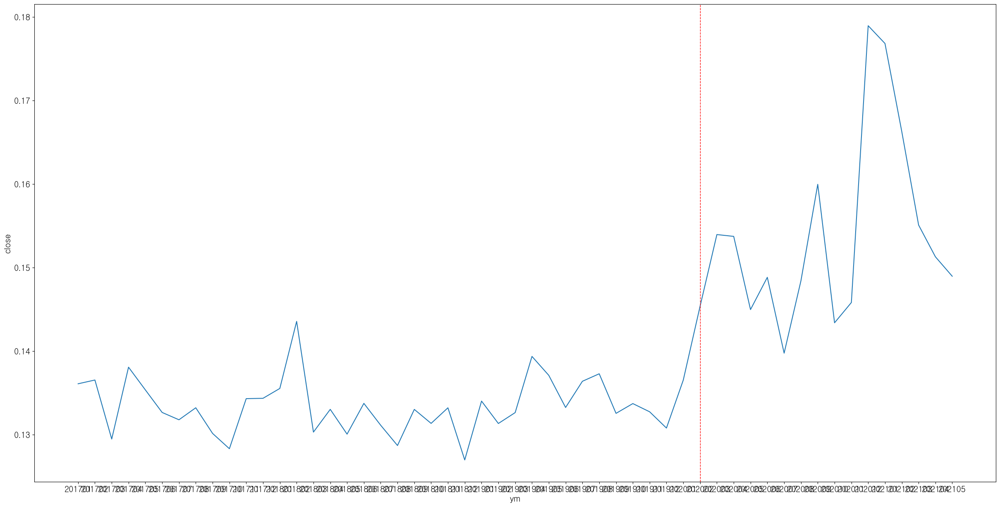

In [282]:
sns.lineplot(x = 안양_['ym'], y = 안양_['close'])
plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)

In [308]:
강남 = native_card[native_card['v3'] == '전주시']
강남 = 강남[강남['cln_age_r'] == 20]
강남

,v1,v2,v3,gb3,gb2,sex_ccd,cln_age_r,ta_ym,daw_ccd_r,apv_ts_dl_tm_r,vlm,usec,close
2953,충북,전북,전주시,여행,숙박,F,20,201701,WHITE,휴식,672800,13,0
2957,전북,전북,전주시,취미오락,종합쇼핑,M,20,201701,RED,활동,407569944,15492,1
2960,서울,전북,전주시,취미오락,외식,M,20,201701,RED,휴식,77126729,3136,0
2964,전북,전북,전주시,취미오락,미용,M,20,201701,WHITE,휴식,82850448,2408,1
6760,경기,전북,전주시,취미오락,종합쇼핑,M,20,201701,RED,휴식,12146267,733,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52712105,경북,전북,전주시,여행,숙박,M,20,202009,RED,활동,306600,5,0
52712113,대전,전북,전주시,스포츠활동,레저스포츠,F,20,202101,RED,휴식,107310,5,0
52712114,전남,전북,전주시,여행,숙박,M,20,202103,RED,취침,609600,10,0
52712124,서울,전북,전주시,스포츠활동,자전거,M,20,202007,RED,활동,152700,5,0


In [309]:
강남_ = 강남.groupby(['ta_ym']).mean()
강남_['ym'] = 강남_.index
강남_['ym'] = 강남_['ym'].apply(lambda x : str(x))

<AxesSubplot:xlabel='ym', ylabel='usec'>

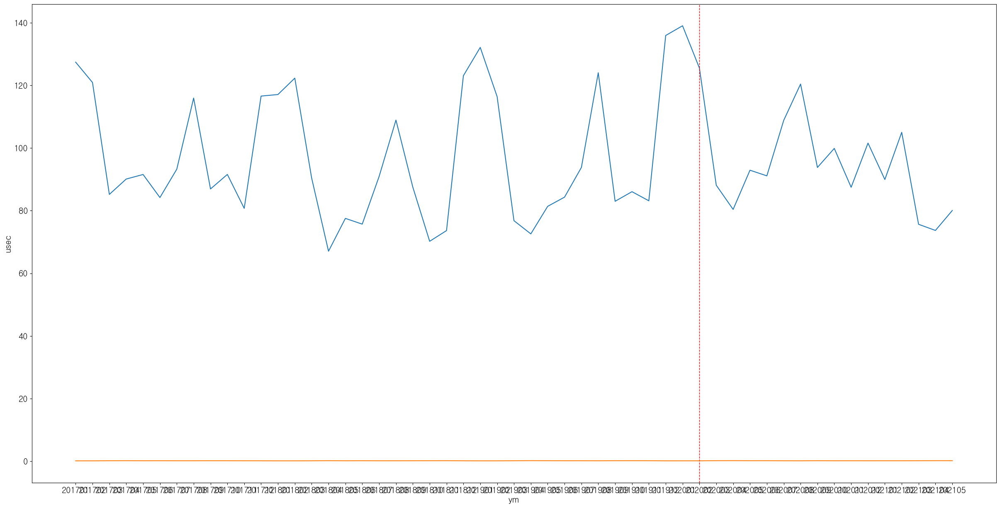

In [305]:
sns.lineplot(x = 강남_['ym'], y = 강남_['usec'])
plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)

sns.lineplot(x = 강남_['ym'], y = 강남_['close'])

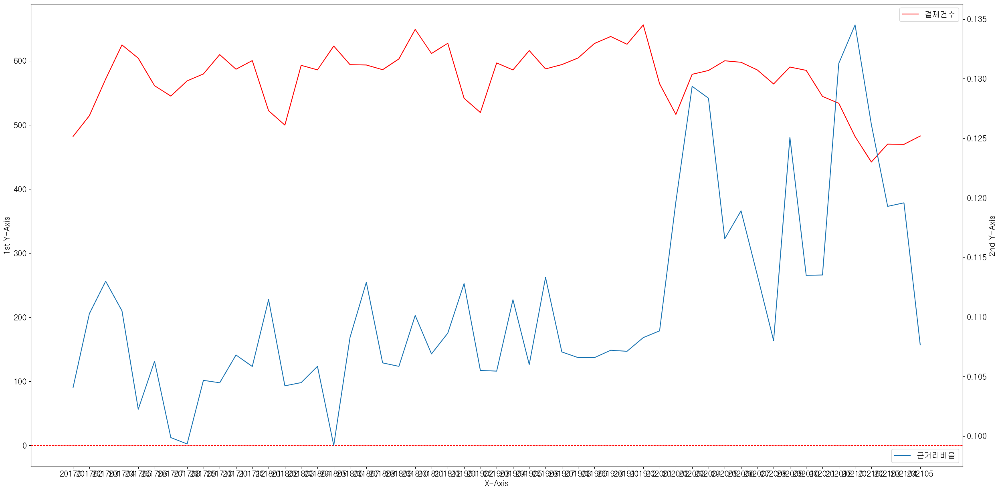

In [310]:
fig, ax1 = plt.subplots()
ax1.set_xlabel('X-Axis')
ax1.set_ylabel('1st Y-Axis')
sns.lineplot(x = 강남_['ym'], y = 강남_['usec'], label = '결제건수',color = 'red')
ax1.legend(loc='upper right')
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)

ax2 = ax1.twinx()
ax2.set_ylabel('2nd Y-Axis')
sns.lineplot(x = 강남_['ym'], y = 강남_['close'], label = '근거리비율')
ax2.legend(loc='lower right')


In [311]:
안양시 = native_card[native_card['v3'] == '안양시']
안양시 = 안양시[안양시['cln_age_r'] == 20]
안양시 = 안양시.groupby(['ta_ym']).mean()
안양시['ym'] = 안양시.index
안양시['ym'] = 안양시['ym'].apply(lambda x : str(x))

In [312]:
강남구 = native_card[native_card['v3'] == '강남구']
강남구 = 강남구[강남구['cln_age_r'] == 20]
강남구 = 강남구.groupby(['ta_ym']).mean()
강남구['ym'] = 강남구.index
강남구['ym'] = 강남구['ym'].apply(lambda x : str(x))

In [313]:
금천구 = native_card[native_card['v3'] == '금천구']
금천구 = 금천구[금천구['cln_age_r'] == 20]
금천구 = 금천구.groupby(['ta_ym']).mean()
금천구['ym'] = 금천구.index
금천구['ym'] = 금천구['ym'].apply(lambda x : str(x))

In [316]:
전주시 = native_card[native_card['v3'] == '전주시']
전주시 = 전주시[전주시['cln_age_r'] == 20]
전주시 = 전주시.groupby(['ta_ym']).mean()
전주시['ym'] = 전주시.index
전주시['ym'] = 전주시['ym'].apply(lambda x : str(x))

In [314]:
평창군 = native_card[native_card['v3'] == '평창군']
평창군 = 평창군[평창군['cln_age_r'] == 20]
평창군 = 평창군.groupby(['ta_ym']).mean()
평창군['ym'] = 평창군.index
평창군['ym'] = 평창군['ym'].apply(lambda x : str(x))

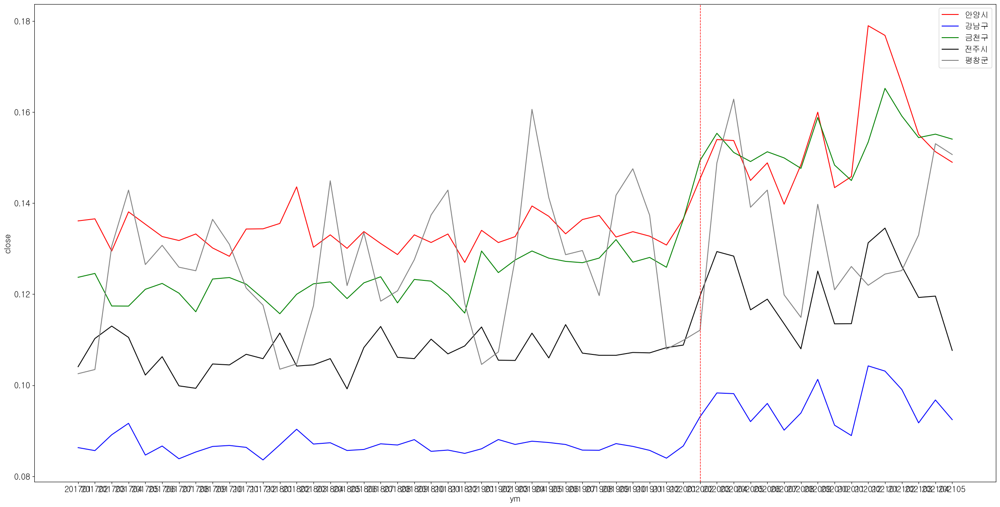

In [318]:
sns.lineplot(x = 안양시['ym'], y = 안양시['close'],color = 'red', label = '안양시')
sns.lineplot(x = 강남구['ym'], y = 강남구['close'],color = 'blue', label = '강남구')
sns.lineplot(x = 금천구['ym'], y = 금천구['close'],color = 'green', label = '금천구')
sns.lineplot(x = 전주시['ym'], y = 전주시['close'],color = 'black', label = '전주시')
sns.lineplot(x = 평창군['ym'], y = 평창군['close'],color = 'gray', label = '평창군')

plt.axvline(x='202002', color='r', linestyle='--', linewidth=1)

